In [1]:
# glc_bm

In [6]:
import shutil
import numpy as np
import os
import mdtraj as md
import glob
import matplotlib.pyplot as plt
# import mpl_toolkits.basemap as bm 
from matplotlib import cm
import time
from pathlib import Path

# include individual python modules
import sys
sys.path.append(os.getcwd()+'/../0_python_modules/')

import extract_sim_data
import prepare_g_input_files
import m_molecular_features
import optimize_MD_frame
import load_sim_exp_data
import store_and_plot_spectra
import optimize_weights
import calculate_optimized_features_distribution
import optimize_MD_frame
import generate_n_iteration_MD_structures
import generate_initial_MD_structures


In [3]:
##################################
### General settings
n_iteration = 1 # n iteration
calculate_all_C = True # if True, then all iterations will be calculated (to see the progress), else only latest one
generate_structures = 50 # number of generated structures
# Load molecular features 
molecule_features = m_molecular_features.class_molecule_features('needed_files/md_inp_files/*.gro','needed_files/md_inp_files/*.itp')


##################################
### MD optimization settings
freeze_amide_bonds_C = False # do you want to freeze amide bonds (HNCO dihedral andles) in original conformation?
NUM_WORKERS_C = 3 # this speeds up optimization of MD frames, ! be careful with number > 2x # of cpus


##################################
### Obtain optimized weights
# overide optimization default settings ###
stop_optimization_when_n_structures_reached_C = [30 for i in range(n_iteration+1)] # either a single number, e.g. 30; or a list of values for each iteration, e.g. [30,40,50,...]
bias_n_structures_reached_C = False # when bias_n_structures_reached_f_C [%] of the structures are non-zero, proceed to subsequent opt round.
bias_n_structures_reached_f_C = 1/2
recalculate_raman_shifting_function_C = True
set_raman_shifting_function_parameters_range_C = [(0.95,1.1),(0.95,1.0),(15,1000),(500,2500)]
relative_optimization_weights_C = [1,1,1,1,1] # Ram/ROA/H/C/Jij
set_K_nd_C = 2/3  # set what % to sample according to the optimized distribution, rest will be random
do_not_filter_C = True # do not filter H/C/Jij dat

# Experimental data for? iteration 1 or more
ed_raman = 1
ed_roa = 1
ed_shifts_H = 1
ed_shifts_C = 1
ed_spinspin = 1
experimental_data_av=[ed_raman,ed_roa,ed_shifts_H,ed_shifts_C,ed_spinspin]


##################################
### simulation data extraction ###
# Raman/ROA data extraction -> use what freq range you need (calculating bigger interval costs more)
raman_frequency_range_C = [50,2000]
# Use Raman shifting fuction? If False, freqeuncies will not be shifted
use_raman_shifting_function_C = True

##################################
### QM calculations settings
# used VDW parameters in QM calculations
oniom_vdw_parameters_kwargs = {'oniom_vdw_parameters_C':'glycam_saccharides'}
# oniom_vdw_parameters_kwargs = {'oniom_vdw_parameters_C':'proteins_1'}
# oniom_vdw_parameters_kwargs = {'oniom_vdw_parameters_C':'proteins_2'}
# oniom_vdw_parameters_kwargs = {'oniom_vdw_parameters_C':'charmm-cgenff','mol_file_path' : 'needed_files/md_inp_files/mol.itp','ffnonbonded_file_path' : 'needed_files/md_inp_files/top/charmm36-mar2019.ff/ffnonbonded.itp'}

# prepare QM input files method
prepare_qm_input_files_C = 'm2_raman_high' # m1_raman_low/m2_raman_high

# gaussian input files nproc & memory
memory = 40
nproc = 36
qm_m_nproc = [memory,nproc]

# Calculate Raman/ROA  x H/C NMR shifts  x Jij couplings?
c_vib = 1
c_shifts = 1
c_spinspin = 1
w_calculate = [c_vib,c_shifts,c_spinspin]


No central mol selection
Indices selected:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]
Charge of you molecule is: 0


In [ ]:
if n_iteration == 0:
    
    # Generate initial plumed file and assign it, generate index file, write fromacs mdp files
    molecule_features.write_plumed('needed_files/plumed_original.dat')
    molecule_features.gro_to_pdb()
    molecule_features.make_index_file()
    molecule_features.write_gromacs_mdp_files()

    # Generate new structures - initial 0th simualtion
    generate_initial_MD_structures.generate_new_structures(molecule_features,n_iteration,generate_structures,freeze_amide_bonds = freeze_amide_bonds_C)

    # optimize MD frames - usable for nth iteration
    optimize_MD_frame.optimize_individual_frames(n_iteration,generate_structures,molecule_features,num_workers = NUM_WORKERS_C,freeze_amide_bonds = freeze_amide_bonds_C)

    # Generate gaussian input files
    prepare_qm_input_files_kwargs = {'method':prepare_qm_input_files_C,**oniom_vdw_parameters_kwargs}
    prepare_g_input_files.prepare_qm_input_files(molecule_features,n_iteration,w_calculate,qm_m_nproc,**prepare_qm_input_files_kwargs)    
    
    print("Structures + qm input files generated. Proceed to iteration 1.")

    # rsync -av --delete /home/ondrej/repo/vlada_optim_sugars/sugaroptim/glc_bm_test/new_iteration_0/input_files/ aurum:/home1/tichacek/sugaroptim/glc_bm_test/new_iteration_0/input_files/
    # rsync -av /home/ondrej/repo/vlada_optim_sugars/sugaroptim/scripts/submit_gaussian.sh aurum:/home1/tichacek/sugaroptim/glc_bm_test/new_iteration_0/

    # rsync -av aurum:/home1/tichacek/sugaroptim/glc_bm_test/new_iteration_0/input_files/ /home/ondrej/repo/vlada_optim_sugars/sugaroptim/glc_bm_test/new_iteration_0/input_files/


In [7]:
# Extract data from iteration X
if n_iteration >= 1:
    
    it_analyze = n_iteration - 1
    extract_sim_data.calculate_all_sim_data('new_iteration_{0}'.format(it_analyze),molecule_features,\
                                            use_raman_shifting_function = use_raman_shifting_function_C,\
                                            raman_frequency_range = raman_frequency_range_C,\
                                           )

    # calculate features after QM optimization (Plumed)
    def calculate_features_after_qm_optimization(molecular_features,directory):
        for file_i in glob.glob(directory+'/f*'):
            molecule_features.write_plumed_print_features(file_i+'/plumed_features.dat',file_i+'/',1)
            os.system("printf \"0 \\n\"|gmx trjconv -f {0} -s {0} -o {1}/trj_tmp.xtc".format(file_i+"/structure_final.gro",file_i))
            os.system("plumed driver --plumed {0}/plumed_features.dat --mf_xtc {0}/trj_tmp.xtc".format(file_i))
            
            if Path('needed_files/plumed_additional_features.dat').exists():
                molecule_features.write_additional_plumed_print_features(file_i+'/plumed_additional_features.dat',file_i+'/')
                os.system("plumed driver --plumed {0}/plumed_additional_features.dat --mf_xtc {0}/trj_tmp.xtc".format(file_i))

    calculate_features_after_qm_optimization(molecule_features,'new_iteration_{0}/input_files'.format(it_analyze))      


Extracting vibrational data.
Extracting NMR H/C data.
Extracting NMR Jij couplings.


50 files loaded.
50 files loaded.
Relative optimization weights are:  [1, 1, 1, 1, 1]
First optimization round
Optimization will stop when # structures is less than 30.
Best result obtained during the whole optimization will be picked.
Counting errors of:  Raman, ROA, H shifts, C shifts, Jij
step:0, non-zero structures: 50, overall cost: 290.74 ram:52.94 roa:82.62 sch:49.61 scc:44.30 jij: 61.27 strb:  0.00
step:1000, recalculating Raman/ROA shifting function.
Best results so far, it:  1000 ,sum_error:  259.2 ,error array:  [47.27 66.34 43.82 45.4  56.36 50.  ]
After optimization - recalculating Raman/ROA shifting function.
Subsequent optimization round 0.
step:10000, recalculating Raman/ROA shifting function.
step:10000, non-zero structures: 50, overall cost: 248.63 ram:47.00 roa:61.74 sch:41.37 scc:47.88 jij: 50.64 strb:  0.00
step:20000, non-zero structures: 50, overall cost: 266.78 ram:39.42 roa:80.31 sch:44.74 scc:45.79 jij: 56.52 strb:  0.00
step:25000, recalculating Raman/ROA shi

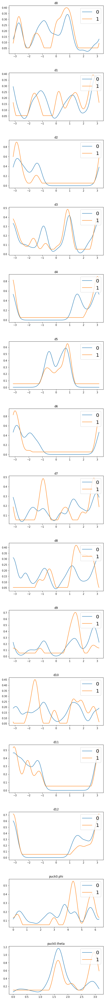

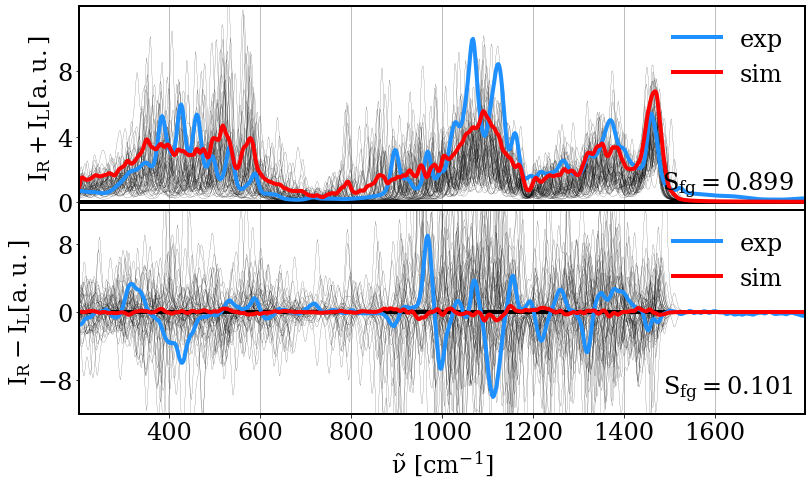

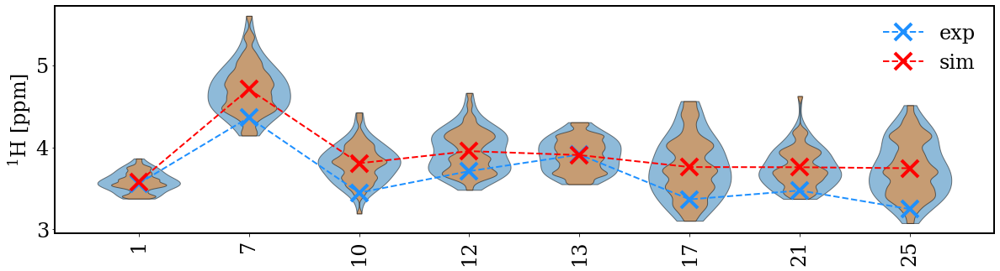

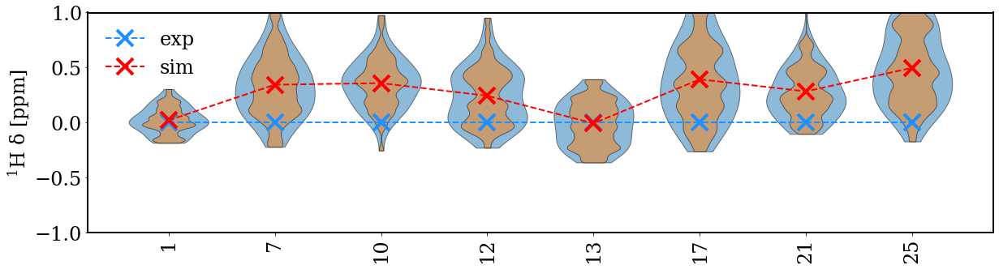

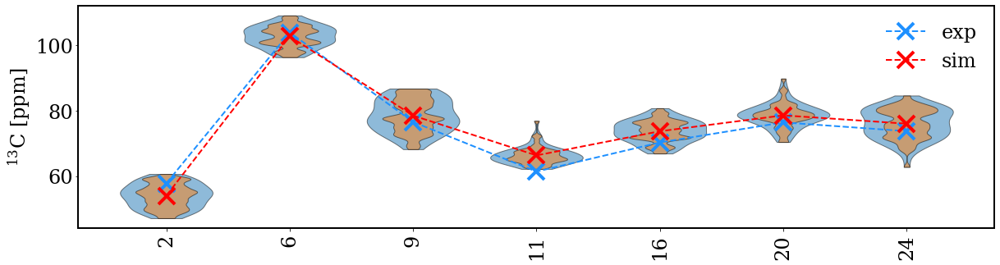

...

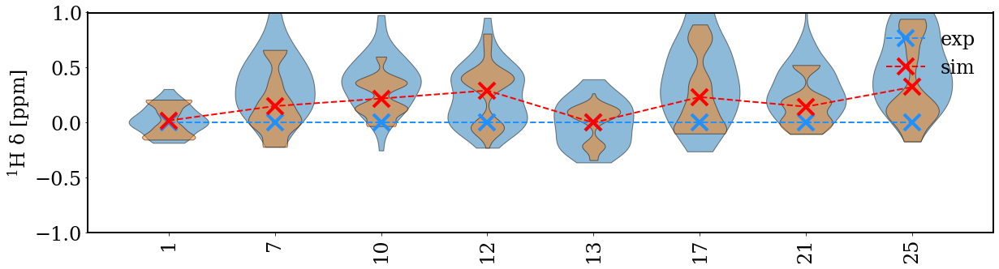

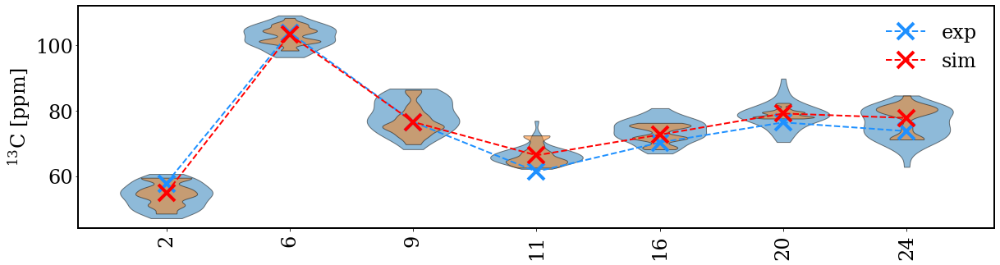

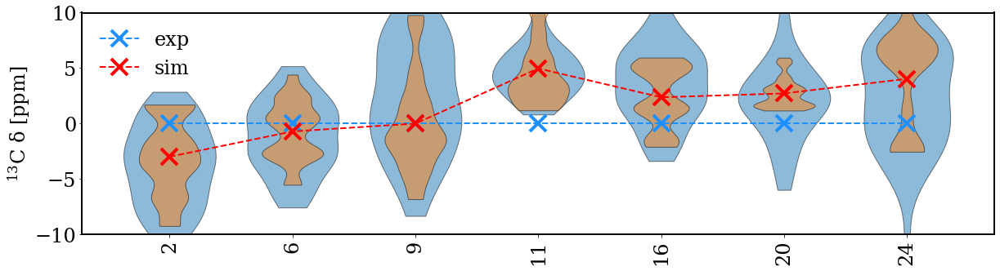

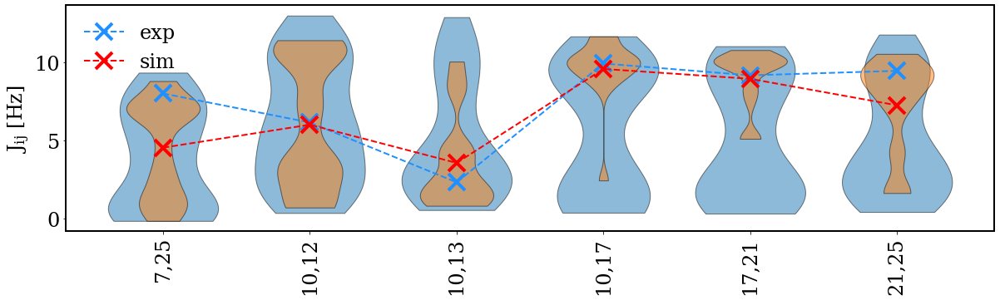

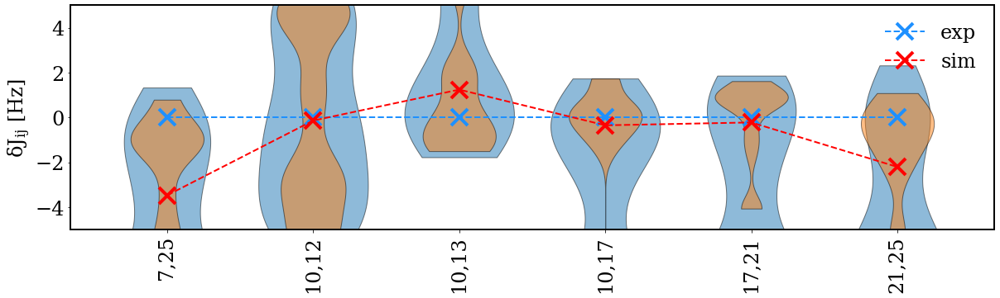

In [8]:
# Calculate progressively the new distribution and check convergence
new_distribution = []
spectra_data = []
error_data_array = []

if n_iteration >= 1:
    
    if calculate_all_C == True:

        all_data = load_sim_exp_data.data('new_iteration_0',0,molecule_features,experimental_data_av, do_not_filter = do_not_filter_C)
        weights0 = np.ones(len(all_data.sim.file_array))/np.sum(np.ones(len(all_data.sim.file_array))) 
        spectra_data.append(store_and_plot_spectra.spectra(weights0,all_data,experimental_data_av))

        # calculate new distribution 
        new_distribution.append(calculate_optimized_features_distribution.\
        calculate_new_distribution(weights0,all_data.sim,molecule_features,K = 1))

        for i in np.arange(n_iteration):

            # load data
            path = 'new_iteration_[0-{0}]'.format(i)
            all_data = load_sim_exp_data.data(path,i+1,molecule_features,experimental_data_av, do_not_filter = do_not_filter_C)

            # optimize the weights
        #     stored_results = optimize_weights.optimize_weights(all_data,experimental_data_av,\
            stored_results = optimize_weights.optimize_weights(all_data,experimental_data_av,\
                                                      recalculate_raman_shifting_function = recalculate_raman_shifting_function_C,\
                                                      set_raman_shifting_function_parameters_range = set_raman_shifting_function_parameters_range_C,\
                                                      stop_optimization_when_n_structures_reached = stop_optimization_when_n_structures_reached_C,\
                                                      bias_n_structures_reached = bias_n_structures_reached_C, \
                                                      bias_n_structures_reached_f = bias_n_structures_reached_f_C, \
                                                      relative_optimization_weights = relative_optimization_weights_C,\
                                                     )

            weights = stored_results.weights
            error = stored_results.error
            error_data_array_i = stored_results.error_data_array_i

            # when converged - we can plot it
            spectra_data.append(store_and_plot_spectra.spectra(weights,all_data,experimental_data_av))

            # calculate new distribution 
            new_distribution.append(calculate_optimized_features_distribution.\
                        calculate_new_distribution(weights,all_data.sim,molecule_features,K = set_K_nd_C))

            # append the error data array
            error_data_array.append(error_data_array_i)


        # check the convergence
        f, ax = plt.subplots(new_distribution[0].nfeatures,1,figsize=(7,new_distribution[0].nfeatures*5))

        for i in np.arange(np.shape(spectra_data)[0]):
            nd=new_distribution[i]
            for j in nd.importance_list[:,0]:
                idx=int(j)
                ax[idx].plot(nd.nd_array[idx][0],nd.nd_array[idx][3],label=i)
                ax[idx].title.set_text(all_data.sim.features_def_list[idx])
                ax[idx].legend(loc="upper right",fontsize=20)
        f.subplots_adjust(hspace=0.4)
        plt.show()   


        for i in np.arange(np.shape(spectra_data)[0]):
            spectra_data[i].plot()
    else:
        path = 'new_iteration_[0-{0}]'.format(n_iteration-1)
        all_data = load_sim_exp_data.data(path,n_iteration,molecule_features,experimental_data_av, do_not_filter = do_not_filter_C)
        # optimize the weights
        stored_results = optimize_weights.optimize_weights(all_data,experimental_data_av,\
                                                  recalculate_raman_shifting_function = recalculate_raman_shifting_function_C,\
                                                  set_raman_shifting_function_parameters_range = set_raman_shifting_function_parameters_range_C,\
                                                  stop_optimization_when_n_structures_reached = stop_optimization_when_n_structures_reached_C,\
                                                  bias_n_structures_reached = bias_n_structures_reached_C, \
                                                  bias_n_structures_reached_f = bias_n_structures_reached_f_C, \
                                                  relative_optimization_weights = relative_optimization_weights_C,\
                                                 )
        weights = stored_results.weights
        error_data_array_i = stored_results.error_data_array_i
        # append the error data array
        error_data_array.append(error_data_array_i)   
        spectra_data.append(store_and_plot_spectra.spectra(weights,all_data,experimental_data_av))



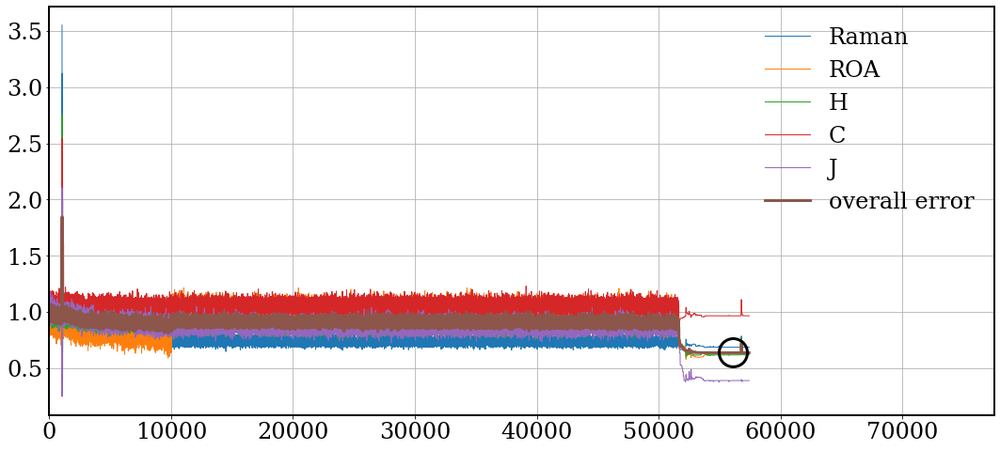

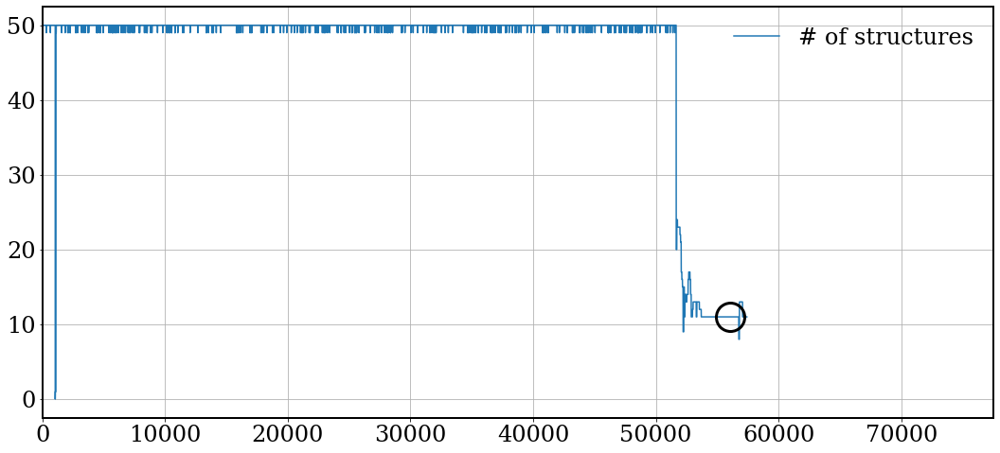

# of non-zero structures/structures
11 50
Proposed relative optimization weights
[0.09226106 0.04933154 0.08073566 1.         0.04094986]
Previous rel opt weights
[1, 1, 1, 1, 1]


In [9]:
# Check last iteration errors

plt.figure(figsize=(18,8))
legend_labels = ['Raman','ROA','H','C','J']
for i in np.arange(np.shape(error_data_array[-1])[-1]-1):
    x = error_data_array[-1][:,i]
    plt.plot(x/x[0],label=legend_labels[i],lw = 1)
    
overall_err = np.sum(error_data_array[-1][:,:-1],axis=1)/len(legend_labels)    
overall_err = overall_err/overall_err[0]
plt.plot(overall_err,label='overall error',lw = 3)
plt.plot(stored_results.error_min_counter,overall_err[stored_results.error_min_counter],'o',color='k',ms = 30,mfc='none',mew = 3)
plt.grid()
plt.legend(framealpha=0.0,loc=1)
plt.xlim([0,1.35*len(x)])
plt.show()
    
plt.figure(figsize=(18,8))
structures = error_data_array[-1][:,-1]
plt.plot(structures,label='# of structures')
plt.plot(stored_results.error_min_counter,structures[stored_results.error_min_counter],'o',color='k',ms = 30,mfc='none',mew = 3)

plt.legend(framealpha=0.0,loc=1)
plt.xlim([0,1.35*len(x)])
plt.grid()
plt.show()
    
err = error_data_array_i[0][:-1]-error_data_array_i[-1][:-1]
proposed_weights = np.array(relative_optimization_weights_C)*np.array([1/(i/np.min(err[err>0])) if i != 0 else 1 for i in err])

print("# of non-zero structures/structures")
print(np.sum(weights > 0.0001*np.max(weights)),len(weights))

print("Proposed relative optimization weights")
print(proposed_weights)   
print("Previous rel opt weights")
print(relative_optimization_weights_C)

iteration 0


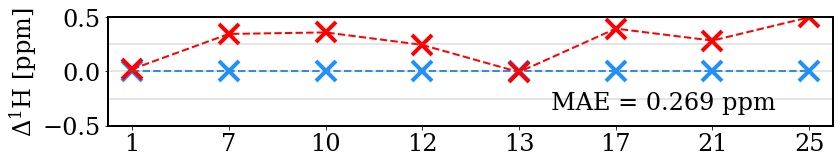

iteration 1


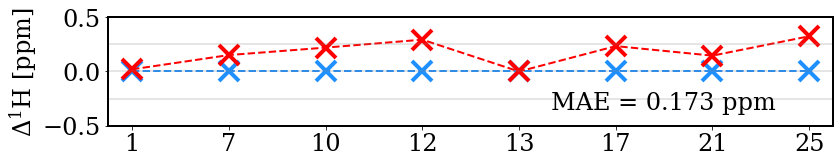

iteration 0


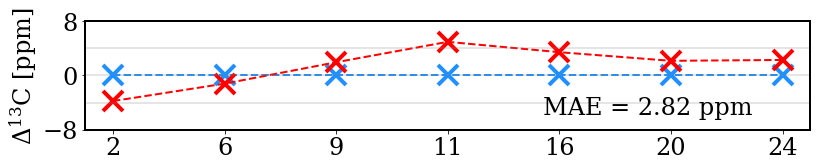

iteration 1


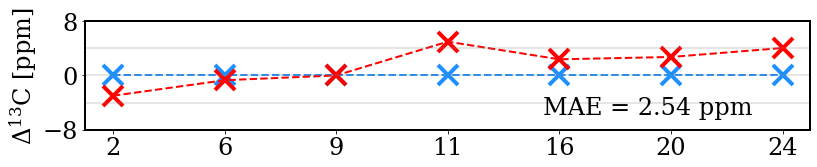

iteration 0


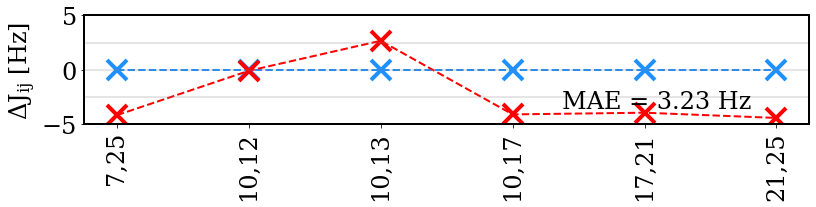

iteration 1


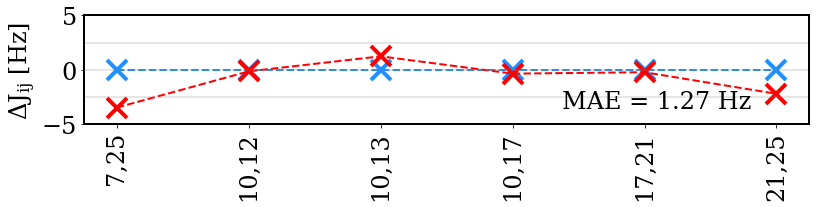

iteration 0


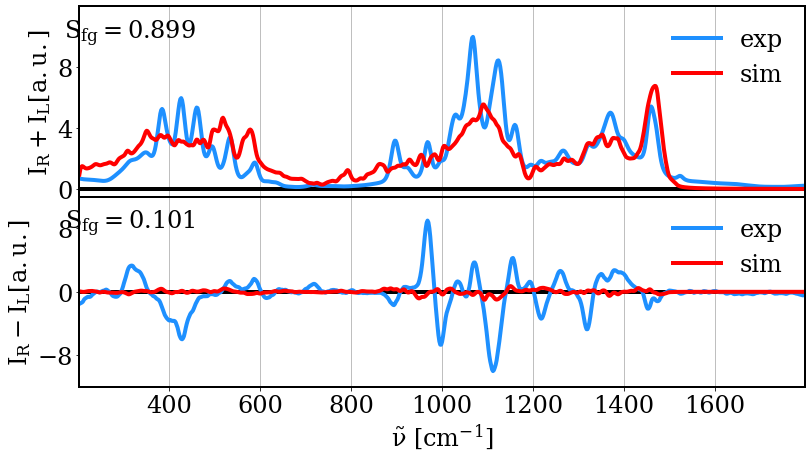

iteration 1


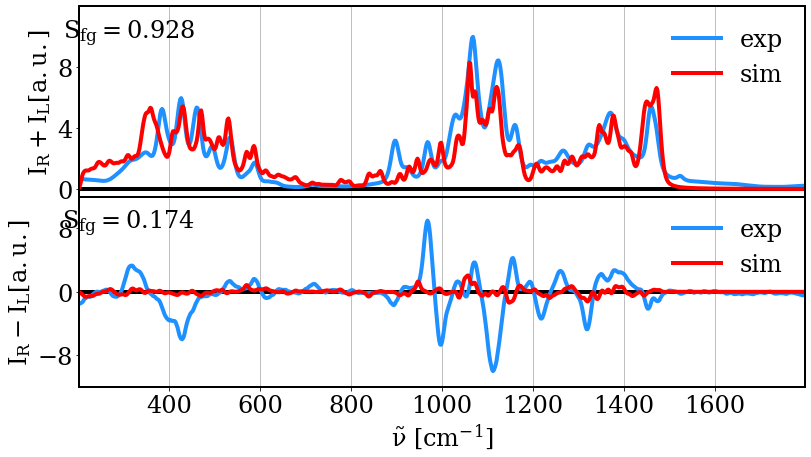

In [10]:
# Check spectra

for i in range(len(spectra_data)):
    print("iteration {0}".format(i))
    spectra_data[i].plot_nmr_shifts_h()
for i in range(len(spectra_data)):
    print("iteration {0}".format(i))
    spectra_data[i].plot_nmr_shifts_c()
for i in range(len(spectra_data)):
    print("iteration {0}".format(i))
    spectra_data[i].plot_nmr_spinspin()
for i in range(len(spectra_data)):
    print("iteration {0}".format(i))
    spectra_data[i].plot_raman()
    

In [ ]:
# if satisfied with the result, then make a new iteration
if n_iteration >= 1:
    # assign final distribution
    final_distribution = calculate_optimized_features_distribution.\
                    calculate_new_distribution(weights,all_data.sim,molecule_features,K = set_K_nd_C)

    # generate new structures using optimized distributions
    generate_n_iteration_MD_structures.generate_new_structures\
            (molecule_features,n_iteration,generate_structures,final_distribution,freeze_amide_bonds = freeze_amide_bonds_C)

    # optimize MD frames - usable for nth iteration
    optimize_MD_frame.optimize_individual_frames(n_iteration,generate_structures,molecule_features,num_workers = NUM_WORKERS_C,freeze_amide_bonds = freeze_amide_bonds_C)

    # Generate gaussian input files
    prepare_qm_input_files_kwargs = {'method':prepare_qm_input_files_C,**oniom_vdw_parameters_kwargs}
    prepare_g_input_files.prepare_qm_input_files(molecule_features,n_iteration,w_calculate,qm_m_nproc,**prepare_qm_input_files_kwargs)    

In [ ]:
# end
################

In [ ]:
# Store mae_sfg_all
data = []
for idx_it in range(np.shape(spectra_data)[0]):
    sch_mae = np.average(np.abs(np.dot(spectra_data[idx_it].all_data.sim_data_array[3].transpose(),spectra_data[idx_it].weights) - spectra_data[idx_it].all_data.exp_data_array[3]))
    scc_mae = np.average(np.abs(np.dot(spectra_data[idx_it].all_data.sim_data_array[4].transpose(),spectra_data[idx_it].weights) - spectra_data[idx_it].all_data.exp_data_array[4]))
    jij_mae = np.average(np.abs(np.dot(spectra_data[idx_it].all_data.sim_data_array[5].transpose(),spectra_data[idx_it].weights) - spectra_data[idx_it].all_data.exp_data_array[5]))
    sfg_roa = store_and_plot_spectra.S_fg_calculate(spectra_data[idx_it].sim_roa,spectra_data[idx_it].exp_roa)
    sfg_ram = store_and_plot_spectra.S_fg_calculate(spectra_data[idx_it].sim_ram,spectra_data[idx_it].exp_ram)
    data.append([sfg_ram,sfg_roa,sch_mae,scc_mae,jij_mae])
with open('tmp_files/sfg_mae_progressions.dat','w') as fw:
    for i in data:
        fw.write("{0} {1} {2} {3} {4} \n".format(*i))    
        
data_i = np.loadtxt('tmp_files/sfg_mae_progressions.dat')

# Raman & ROA 
data_i[:,0] = 1 - data_i[:,0]
data_i[:,1] = 1 - data_i[:,1]

c_arr = np.array([500.0, 71.75, 177.1, 16.83, 18.76])
overall_error = np.sum(data_i*c_arr,axis=1)

# set plot parameters
import matplotlib as mpl
from matplotlib import rc
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams["font.size"] = "22"
plt.figure(figsize=(8,6))

set_lw_c = 3
set_ms_c = 15
set_mew_c = 3
plt.plot(range(len(data_i[:,0])),(data_i[:,0])/(data_i[0,0]),'x--',color = 'b',label ='Raman',lw = set_lw_c, ms = set_ms_c,mew = set_mew_c)
plt.plot(range(len(data_i[:,0])),(data_i[:,1])/(data_i[0,1]),'x--',color = 'orange',label ='ROA',lw = set_lw_c, ms = set_ms_c,mew = set_mew_c)
plt.plot(range(len(data_i[:,0])),(data_i[:,2])/(data_i[0,2]),'x--',color = 'green',label =r'$\mathregular{^{1}H}$',lw = set_lw_c, ms = set_ms_c,mew = set_mew_c)
plt.plot(range(len(data_i[:,0])),(data_i[:,3])/(data_i[0,3]),'x--',color = 'purple',label = r'$\mathregular{^{13}C}$',lw = set_lw_c, ms = set_ms_c,mew = set_mew_c)
plt.plot(range(len(data_i[:,0])),(data_i[:,4])/(data_i[0,4]),'x--',color = 'r',label = r'$\mathregular{J_{ij}}$',lw = set_lw_c, ms = set_ms_c,mew = set_mew_c)

# overall error
plt.plot(range(len(data_i[:,0])),overall_error/overall_error[0],'x-',color = 'k',label = 'overall error',lw = 1.5*set_lw_c, ms = set_ms_c,mew = set_mew_c)

plt.ylim([-0.05,1.35])
plt.xlabel('iteration')
plt.ylabel('relative error')
plt.legend(framealpha=0,ncol=3,borderaxespad=0,loc=1,columnspacing=0.75)
plt.xticks(np.arange(np.max([np.shape(data_i)[0] for i in data_i])))
plt.yticks(np.linspace(0,1.2,7))
plt.grid()
plt.savefig("figures/glc_bm_sfg_mae_relative_errors_convergence.pdf", format='pdf',transparent=True,bbox_inches='tight')
plt.show()